<a href="https://colab.research.google.com/github/valtsao17/PriSTI_experiment/blob/main/Lab_6_scenario_based_class.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Lab 6 - download and analyze climate projections
_____________


In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 600
import pandas as pd

## _Climate change - analyze data_

Streamflow projections for the Colorado River at the Grand Canyon from USBR database.

Load data. Combine first three columns into a datetime index.

In [2]:
url = 'https://raw.githubusercontent.com/m-zaniolo/CEE690-ESAA/main/data/'

# Step 1: Download the zip file
!wget -O streamflow_data.zip https://raw.githubusercontent.com/m-zaniolo/CEE690-ESAA/main/data/streamflow_cmip5_ncar_day_GRAND.csv.zip

# Step 2: Unzip the file
!unzip streamflow_data.zip -d content/

df = pd.read_csv('content/streamflow_cmip5_ncar_day_GRAND-2.csv',
                  index_col='datetime',
                  parse_dates={'datetime': [0,1,2]})

--2025-03-26 19:33:50--  https://raw.githubusercontent.com/m-zaniolo/CEE690-ESAA/main/data/streamflow_cmip5_ncar_day_GRAND.csv.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20387212 (19M) [application/zip]
Saving to: ‘streamflow_data.zip’

streamflow_data.zip 100%[===================>]  19.44M  --.-KB/s    in 0.1s    

2025-03-26 19:33:51 (140 MB/s) - ‘streamflow_data.zip’ saved [20387212/20387212]

Archive:  streamflow_data.zip
  inflating: content/streamflow_cmip5_ncar_day_GRAND-2.csv  
  inflating: content/__MACOSX/._streamflow_cmip5_ncar_day_GRAND-2.csv  


<ipython-input-2-227d4a0496ee>:9: FutureWarning: Support for nested sequences for 'parse_dates' in pd.read_csv is deprecated. Combine the desired columns with pd.to_datetime after parsing instead.
  df = pd.read_csv('content/streamflow_cmip5_ncar_day_GRAND-2.csv',


Example - filter columns

In [3]:
#filter by RCP
df_rcp85 = df.filter(like='rcp85')

#filter by product (by model)
df_rcp85_miroc = df.rcp85.filter(like='microc')

AttributeError: 'DataFrame' object has no attribute 'rcp85'

Let's see how the daily projections look like:

In [ ]:
df_rcp85_miroc.plot()

### Annual data ###

It's hard to spot trends with daily timeseries. Pandas is really convenient for processing timeseries because it has several built-in methods to aggregate and resample data.

We will use: `resample` and `rolling`

In [4]:
#sum daily values to annual values
annual_df = df.resample('YE').sum() #sum daily values to annual values

# It is still hard to interpret trends from annual values

# if we plot the three projections from before:
df_rcp85_miroc


NameError: name 'df_rcp85_miroc' is not defined

We can better grasp trends with rolling window mean

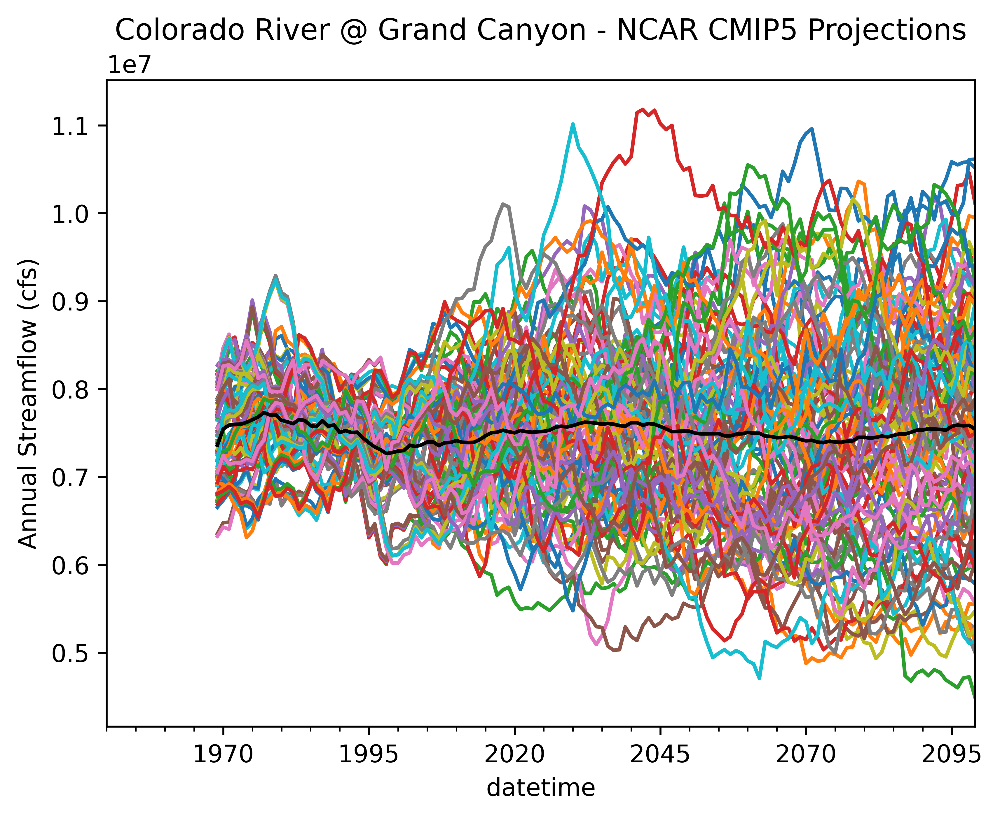

In [5]:
annual_df = df.resample('YE').sum() #sum daily values to annual values
#rolling window of 20 years, take avg value
annual_df_rol20 = annual_df.rolling(window=20).mean()


mean_projection = annual_df_rol20.mean(axis = 1)
annual_df_rol20.plot(legend=None)
mean_projection.plot(color = 'k')
plt.title('Colorado River @ Grand Canyon - NCAR CMIP5 Projections')
plt.ylabel('Annual Streamflow (cfs)')
plt.show()



Example: filter by RCP (2.6, 4.5, 6, 8.5) and plot each projection with a different color

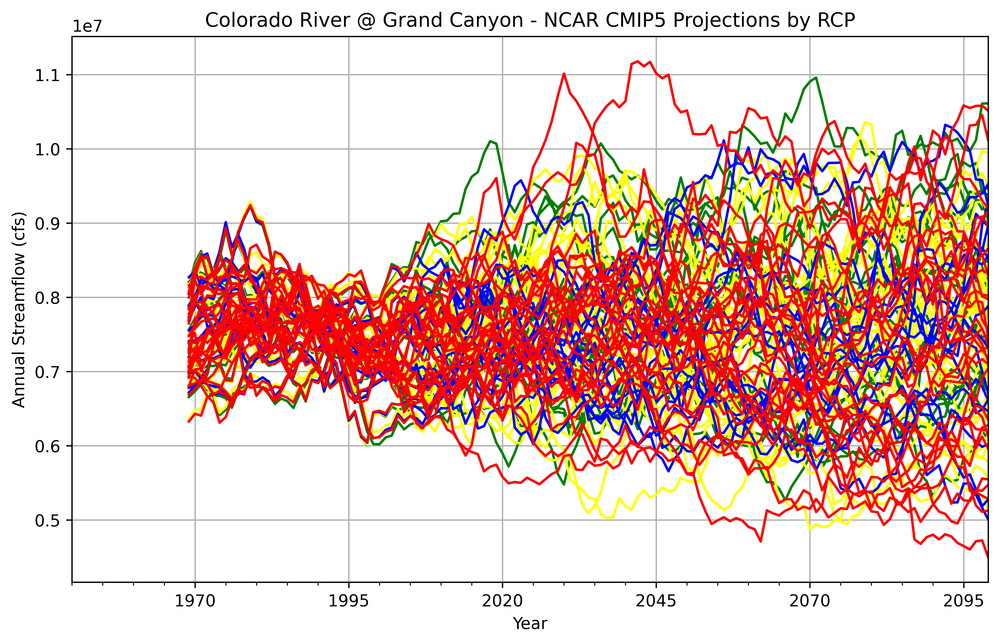

In [6]:
#
annual_df_rcp26 = annual_df_rol20.filter(like='rcp26')
annual_df_rcp45 = annual_df_rol20.filter(like='rcp45')
annual_df_rcp60 = annual_df_rol20.filter(like='rcp60')
annual_df_rcp85 = annual_df_rol20.filter(like='rcp85')

# Create a new figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each DataFrame on the same axis with different colors
annual_df_rcp26.plot(ax=ax, legend=None, color='green')
annual_df_rcp45.plot(ax=ax, legend=None, color='yellow')
annual_df_rcp60.plot(ax=ax, legend=None, color='blue')
annual_df_rcp85.plot(ax=ax, legend=None, color='red')

# Add plot details
ax.set_xlabel('Year')
ax.set_ylabel('Annual Streamflow (cfs)')
plt.title('Colorado River @ Grand Canyon - NCAR CMIP5 Projections by RCP')
ax.grid(True)  # Optional: add a grid for readability

plt.show()
# difference is due to model and not emissions




---

##Indicators##

Annual peak flow

<Axes: xlabel='datetime'>

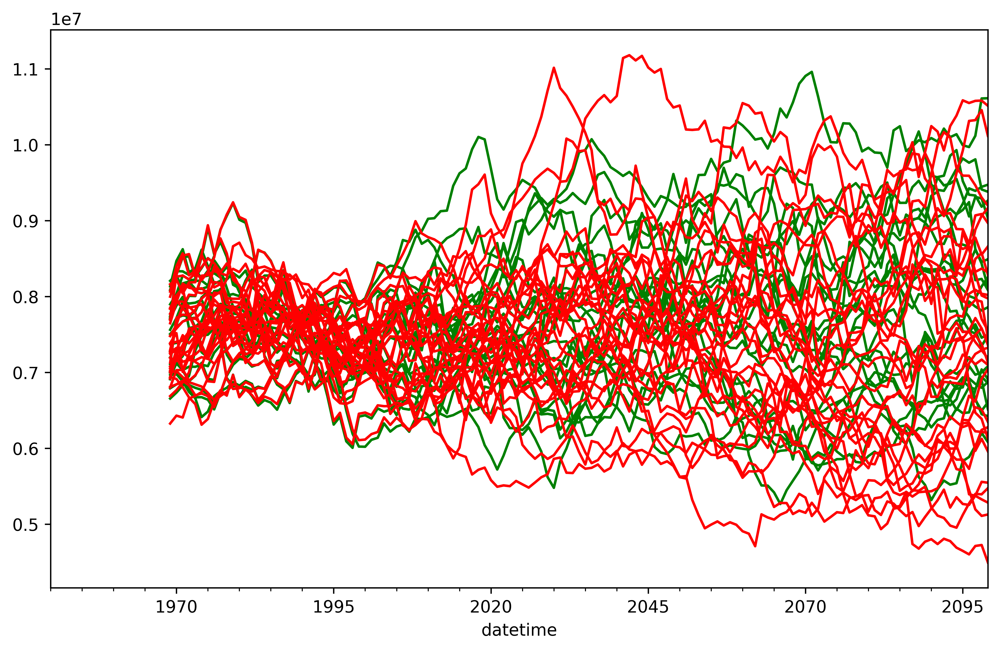

In [7]:
#annual max - hint: resample over the year, aggregate with the max,
# and then show the trend with a rolling mean
annual_max_df = df.resample('YE').max()
annual_max_df_roll20 = annual_df.rolling(window=20).mean()

#let's just focus on the two extreme RCP to identify any differences
annual_max_df_roll20_rcp26 = annual_max_df_roll20.filter(like='rcp26') # best scenario

annual_max_df_roll20_rcp85 = annual_max_df_roll20.filter(like='rcp85') # worst scenario

fig, ax = plt.subplots(figsize=(10, 6))

# Plot each DataFrame on the same axis with different colors
annual_max_df_roll20_rcp26.plot(ax=ax, legend=None, color='green')
annual_max_df_roll20_rcp85.plot(ax=ax, legend=None, color='red')

# annual max going up = more floods?
# annual max going down = less water in general?

Generate a boxplot for these values:

<ipython-input-8-b0aac717f350>:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([data_rcp26, data_rcp85], labels=['RCP26', 'RCP85'],  widths=0.5)


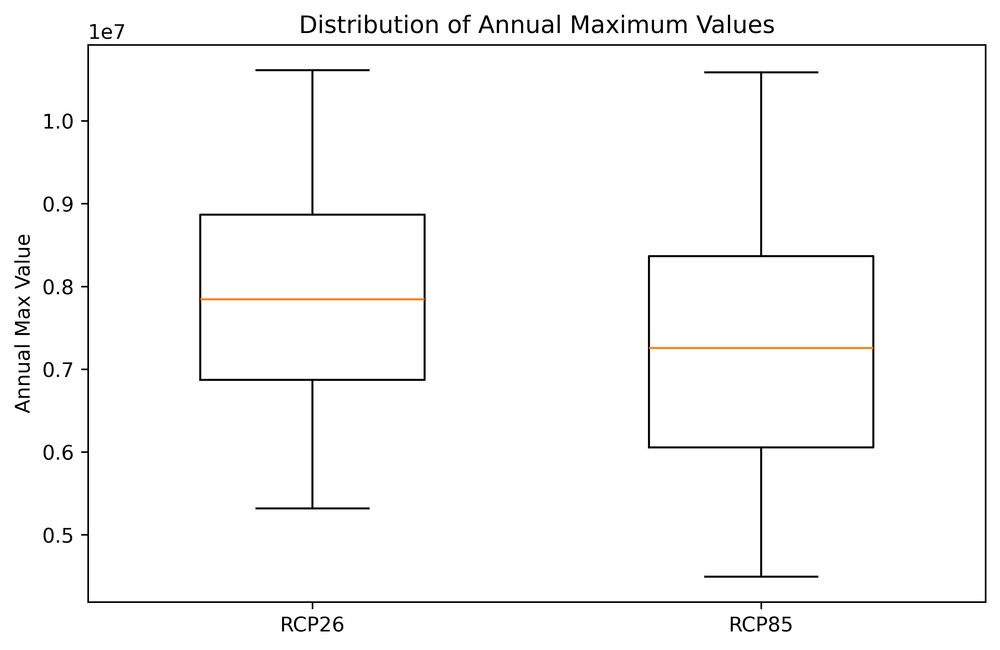

In [8]:
# Extract all values from each DataFrame and flatten them into single arrays
data_rcp26 = annual_max_df_roll20_rcp26.values[-20:].flatten() #focus on the last 20 years of data (end of century)
data_rcp85 = annual_max_df_roll20_rcp85.values[-20:].flatten()

# Plot box plots for each dataset side-by-side
plt.figure(figsize=(8, 5))
plt.boxplot([data_rcp26, data_rcp85], labels=['RCP26', 'RCP85'],  widths=0.5)

# Customize plot appearance
plt.ylabel('Annual Max Value')
plt.title('Distribution of Annual Maximum Values')

plt.show()

---

### Trend

Identify drying trends:

Identify the driest 10th percentile of the ensemble at the end of the horizon

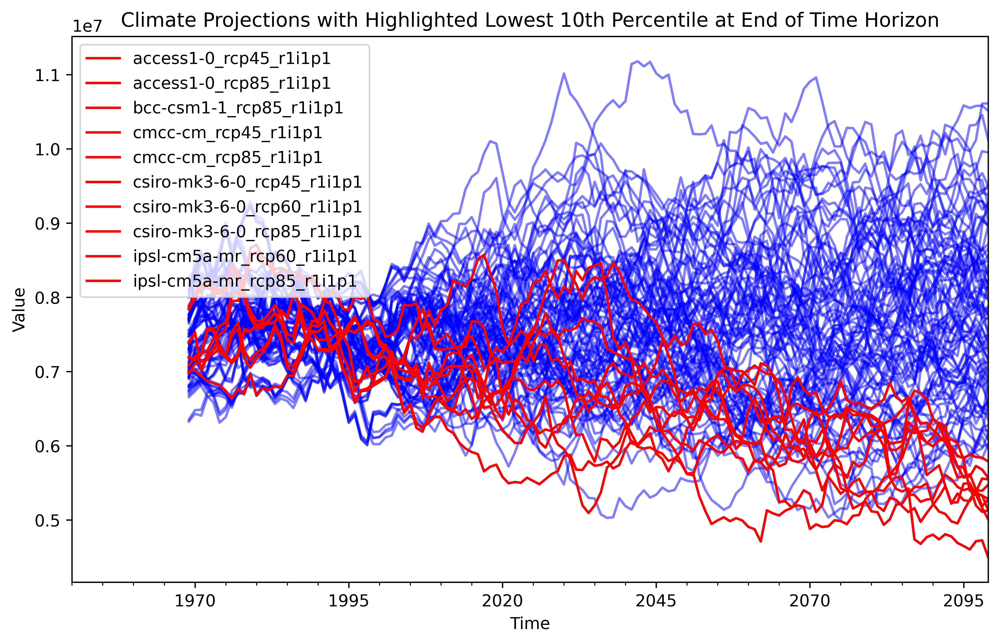

In [9]:
# Step 1: Select the last row (end of the time horizon)
# Step 2: Calculate the 10th percentile for the last row
# Step 3: Identify the time series that fall into the lowest 10th percentile

last_row = annual_df_rol20.iloc[-1]
percentile_10 = last_row.quantile(0.1) #the value of 10% driest condition

driest_projections = last_row[last_row <= percentile_10].index

# Step 4: Plot all time series, with the lowest 10th percentile in red
fig, ax = plt.subplots(figsize=(10, 6))
# Plot all projections in blue
annual_df_rol20.plot(ax = ax, legend = None, color='blue', alpha=0.5)
# Highlight lowest 10th percentile time series in red
annual_df_rol20[driest_projections].plot(ax = ax, color='red')

plt.title('Climate Projections with Highlighted Lowest 10th Percentile at End of Time Horizon')
plt.xlabel('Time')
plt.ylabel('Value')
plt.show()

### Variance

Identify scenarios with highest interannual variability.
For this analysis, let's use annual values rather than 20-year rolling means

In [ ]:
# Step 1: Calculate the standard deviation for each projection
# Step 2: Determine the threshold for the top 5th percentile
# Step 3: Identify the projections in the top 5th percentile of variability

annual_df = df.resample('YE').sum()
annual_std = annual_df.std()
top_5_prct_thr = annual_std.quantile(0.95) # picking out highest quantiles of standard deviation
most_variable_projections = annual_std[annual_std >= top_5_prct_thr].index


# Step 4: Plot all projections in blue, with top variability projections in red
# Note: we plot the rolling mean projections for readability

fig, ax = plt.subplots(figsize=(10, 6))
# Plot all projections in blue
annual_df_rol20.plot(ax = ax, legend = None, color='blue', alpha=0.5)
# Highlight time series in red
annual_df_rol20[most_variable_projections].plot(ax = ax, color='red')

plt.title('Climate Projections with HighlightedMost variable projections')
plt.xlabel('Time')
plt.ylabel('Value')
plt.show()

### Discussion:
We developed code to identify:

1) changes in indicators (annual 1-day peak flow)

2) most pronounced trends (dryest 10th percentile, we could do the same for wettest prct)

3) most pronounced interannual variability

Why is this useful?

----------------